<b>Preparation</b>

In [2]:
!pip install pydicom
!pip install trimesh
!python -m pip install pymeshlab

import os # for file-handling
import numpy as np # maths
import matplotlib.pyplot as plt # plotting
from pydicom import dcmread # reading DICOM files

In [4]:
current_path=os.getcwd()
print(current_path)

C:\Users\nasta\Visualization


<b>Loading the data file</b>

In [17]:
import zipfile
with zipfile.ZipFile("DICOM_Brain.zip","r") as zip_ref:
    zip_ref.extractall(current_path) 

<b>Reading the dicom images</b>

In [19]:
# Read a volume and convert to numpy array 
def read_dcm_volume(name):
    volume_img = []
    for file in sorted(os.listdir(name)):
        dcm_slice = dcmread(os.path.join(name, file))
        volume_img.append(dcm_slice.pixel_array)
    return np.transpose(np.array(volume_img),(1,2,0))


# Load the volume
dcm_volume = read_dcm_volume('DICOM_Brain')

<b>Plotting the dicom images</b>

(256, 256, 20)


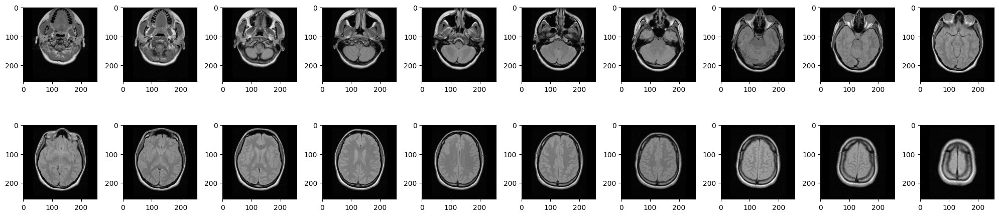

In [23]:
# Plot all slices in z-direction
fig = plt.figure(figsize=(20, 5))
print(dcm_volume.shape)
columns = int(dcm_volume.shape[2]/2) #10
rows = 2 
for i in range(1, int(columns*rows +1)): # 1 to 20
    img = dcm_volume[:,:,i-1]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')
plt.tight_layout()
plt.show()

<b>Using the Marching Cubes algorithm to generate an indirect volume visualization (surface model) of the data set.</b>

In [25]:
from skimage import measure


############################################
# Perform the marching cubes algorithm here
############################################


# Adjust scale (medical data is often anisotropic --> the spacing in z-direction is different from the spacing in x- and -direction)
# We do this by multiplying the vertice positions in x, y, and z direction with the correct spacing factor
# If you skip this step, the plots will show you a distorted model
# Replace "verts" with the variable name you use for your vertices!
verts, faces, normals, values = measure.marching_cubes(dcm_volume, 256)

verts[:,0] *= 0.859375
verts[:,1] *= 0.859375
verts[:,2] *= 7

<b>Perform a mesh decimation to make the process faster by using Clustering Decimation from PyMeshLab. </b>

In [26]:
import pymeshlab
#################################
# Perform a mesh decimation here
#################################
# create a new Mesh with the two arrays
#def decimate_mesh(verts,faces):
m = pymeshlab.Mesh(verts, faces)


# create a new MeshSet
ms = pymeshlab.MeshSet()

# add the mesh to the MeshSet
ms.add_mesh(m, "cube_mesh")
ms.apply_filter('meshing_decimation_clustering')

# get a reference to the current mesh
m = ms.current_mesh()

# get numpy arrays of vertices and faces of the current mesh
v_matrix = m.vertex_matrix()
f_matrix = m.face_matrix()
#return v_matrix, f_matrix

#v_matrix_1, f_matrix_1=decimate_mesh(verts,faces)
#v_matrix_2, f_matrix_2=decimate_mesh(v_matrix_1,f_matrix_1)
#v_matrix_3, f_matrix_3=decimate_mesh(v_matrix_2,f_matrix_2)

###########################################################################################
m2 = pymeshlab.Mesh(v_matrix, f_matrix)


# create a new MeshSet
ms2 = pymeshlab.MeshSet()

# add the mesh to the MeshSet
ms2.add_mesh(m2, "cube_mesh")
ms2.apply_filter('meshing_decimation_clustering')

# get a reference to the current mesh
m2 = ms2.current_mesh()

# get numpy arrays of vertices and faces of the current mesh
v_matrix2 = m2.vertex_matrix()
f_matrix2 = m2.face_matrix()

<b>Apply colormaps based on normal direction</b>

In [27]:
from scipy.spatial.distance import cosine

def apply_color_map(mesh, current_cmap, flip_cm=False):
  face_normals = mesh.face_normal_matrix()
  target_vector = np.array([-0.8,0,1])
  face_colors = []
  vals = []
  maxval = 0
  for i in face_normals:
    val = abs(cosine((i+1)/2, target_vector))
    vals.append(val)
    maxval = max(maxval, val)

  for val in vals:
    if flip_cm: # flip when cmap starts bright
      face_colors.append(current_cmap(1-val/maxval)) # apply colorscale
    else:
      face_colors.append(current_cmap(val/maxval))  
  return face_colors

<b>Visualization of the results</b>

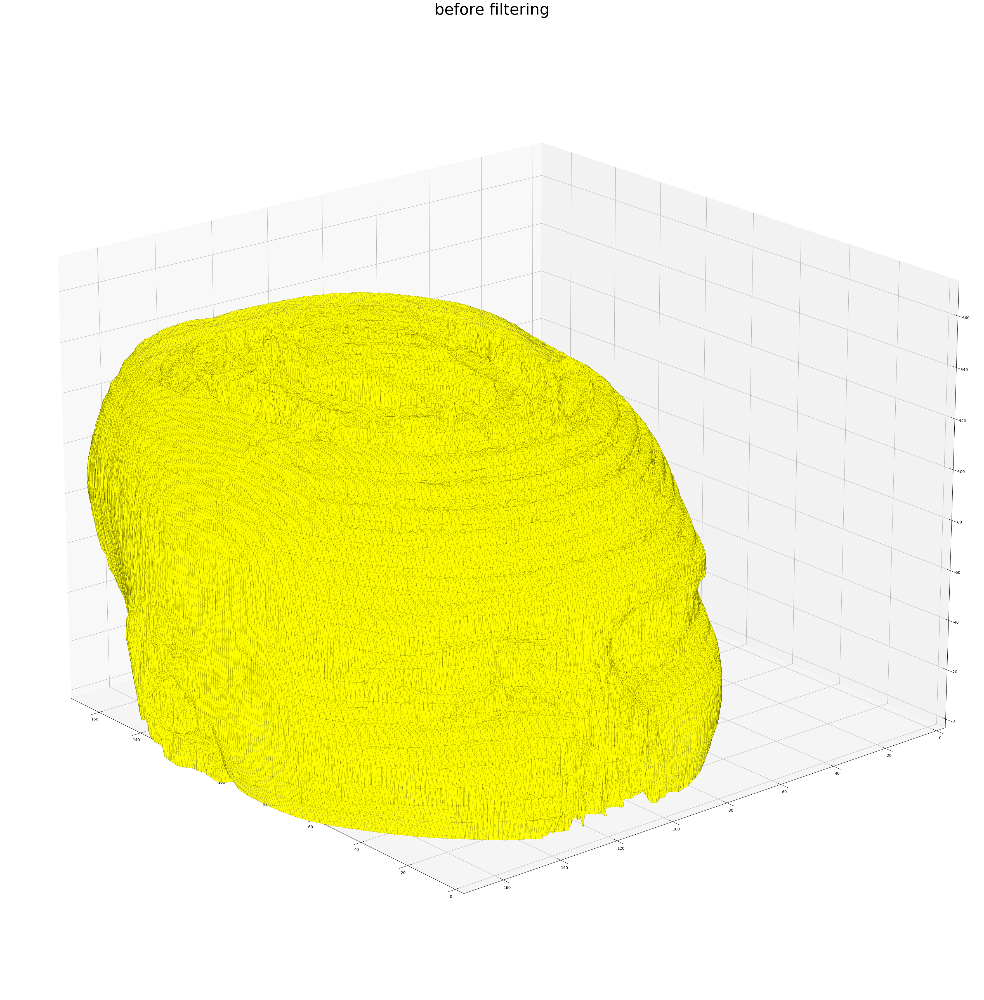

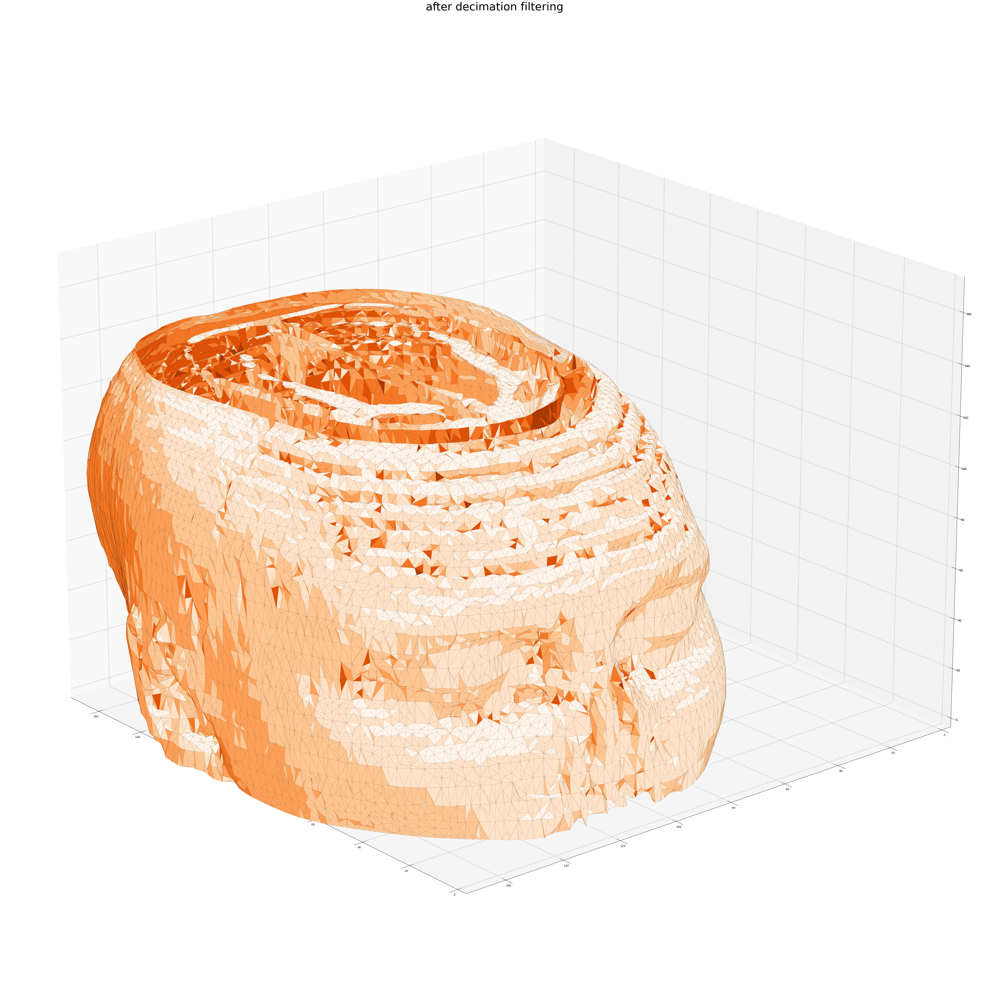

In [30]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib import cm
import matplotlib.pyplot as plt


#############################################################################

face_colors = 'yellow'
# Instead you can apply this color map:
# Recommended only for the decimated mesh.
#m = pymeshlab.Mesh(verts, faces)


fig = plt.figure(figsize=(100, 100))
ax = fig.add_subplot(212, projection='3d')

############################################
# Replace "verts" and "faces" 
# with the correct variable names
############################################

# Fancy indexing: `verts[faces]` to generate a collection of triangles
mesh = Poly3DCollection(verts[faces],linewidth=0.1,edgecolor="k",facecolor = face_colors,rasterized=True)
ax.add_collection3d(mesh)

# axis limits
ax.set_xlim(0, 170)
ax.set_ylim(0, 170)
ax.set_zlim(0, 170)
ax.set_title('before filtering',fontsize = 40)
# viewing angle
ax.view_init(20, 140)


# Display resulting triangular mesh using Matplotlib. This can also be done
# with mayavi (see skimage.measure.marching_cubes_lewiner docstring).
fig = plt.figure(figsize=(100, 100))
ax = fig.add_subplot(212, projection='3d')
face_colors = apply_color_map(m, cm.get_cmap('Oranges', 8), True)
############################################
# Replace "verts" and "faces" 
# with the correct variable names
############################################

# Fancy indexing: `verts[faces]` to generate a collection of triangles
mesh = Poly3DCollection(v_matrix[f_matrix],linewidth=0.1,edgecolor="k",facecolor = face_colors,rasterized=True)
ax.add_collection3d(mesh)

# axis limits
ax.set_xlim(0, 170)
ax.set_ylim(0, 170)
ax.set_zlim(0, 170)
ax.set_title('after decimation filtering',fontsize = 40)
# viewing angle
ax.view_init(20, 140)

plt.tight_layout()
plt.show()